# Sofiya Ibrayeva
## Milestone 1 - Final Project

In [279]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [280]:
ls

CardioGoodFitness.csv
Ibrayeva_PandasChallenge.csv
Ibrayeva_PandasChallenge.ipynb
Milestone 1&2_Ibrayeva.ipynb
PandasInClass_Ibrayeva.ipynb
Salary Data.csv
Spotify_Montero_data.json
Untitled.ipynb
Widgets_challenge.ipynb
amazon_2024_valentines_best_sellers.csv
avg_days_on_loan.html
cces_example_data copy.csv
cces_example_data.csv
checkout_over_time.html
chessbuds_messages.json
class_counts.html
commute.csv
cricket.csv
ibrayeva_SystemsCheck.ipynb
in class_4.ipynb
in class_week3.ipynb
in class_week4.ipynb
inclass_reddit.ipynb
jobs_in_data.csv
library.xlsx
matplotlib Challenge_Ibrayeva.ipynb
matplotlib_inclass.ipynb
plotly pt 2_Ibrayeva.ipynb
plotlychallege_Ibrayeva.ipynb
pokedex.csv
reddit_data_example.csv
seaborn_Group2.ipynb
seaborn_test.ipynb
spotify.csv
subset_cces_example_data.csv
tidyChallenge_Ibrayeva.ipynb
wq.csv
year_counts.html
~$library.xlsx


In [281]:
dlibrary = pd.read_excel('library.xlsx')
dlibrary.head()

,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30 19:57:05,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22 12:50:23,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12 11:02:33,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10 13:43:13,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21 11:26:16,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN


## Data Cleaning process:
* Format the date in the Last Checkout Column;
* Transform thr LC Classification Column by utilizing the dictionary;
* Extract the published year from the Pub year 1 column;
* Calculate the Dats on Loan (Checked in date minus Checked out date);
* Drop unnecessary columns. 

### 1. Data Exploration

In [282]:
dlibrary.keys()

Index(['RECORD #(Item)', 'TITLE', 'Last Checkout (date borrowed)',
       'Last Check In (date returned)', 'Total Checkouts', 'Total Renewals',
       'LC Classification', 'Pub Year 1', 'Pub Year 2', 'Pub Year 3',
       'Pub Year 4'],
      dtype='object')

In [283]:
dlibrary['LC Classification']

0                   P306
1              PL840.N58
2               PR830.T3
3        PS3117 .R8 1901
4             PR3069.B58
              ...       
17768              GE195
17769           CB3 .V53
17770           BF637.C4
17771                 Z6
17772         Z2016 .W74
Name: LC Classification, Length: 17773, dtype: object

In [284]:
dlibrary.isnull().sum()

RECORD #(Item)                       0
TITLE                                0
Last Checkout (date borrowed)        0
Last Check In (date returned)        0
Total Checkouts                      0
Total Renewals                       0
LC Classification                   18
Pub Year 1                         164
Pub Year 2                        9616
Pub Year 3                       17620
Pub Year 4                       17767
dtype: int64

#### We can see that Pub Year 2 , Pub Year3 , Pub Year4 have a lot of missing values, so we can drop these columns

In [285]:
dlibrary.describe()

,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals
count,17773,17773,17773.000000,17773.000000
mean,2023-01-04 12:41:50.407021824,2023-03-30 03:19:18.813931264,10.600180,8.709278
min,2022-01-03 10:21:15,2022-01-07 00:00:00,0.000000,0.000000
25%,2022-07-20 12:02:33,2022-10-24 00:00:00,3.000000,1.000000
50%,2023-01-10 10:46:11,2023-04-14 00:00:00,7.000000,5.000000
75%,2023-07-03 10:00:18,2023-10-02 00:00:00,14.000000,12.000000
max,2024-03-20 10:12:50,2024-03-23 00:00:00,489.000000,278.000000
std,NaN,NaN,12.518262,11.466709


In [286]:
# Creating a new column 'First_Letter' by extracting the first letter of the LC Classification
dlibrary['First_Letter'] = dlibrary['LC Classification'].apply(lambda x: x[0] if pd.notna(x) else '')
dlibrary.head()


,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30 19:57:05,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22 12:50:23,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12 11:02:33,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10 13:43:13,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21 11:26:16,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P


In [287]:
# Defining  dictionary for the classification
classification_dict = {
    'A': 'General Works',
    'B': 'Philosophy, Psychology, Religion',
    'C': 'Auxiliary Sciences of History',
    'D': 'World History',
    'E': 'History of the Americas',
    'F': 'History of the Americas',
    'G': 'Geography, Anthropology, Recreation',
    'H': 'Social Sciences',
    'J': 'Political Science',
    'K': 'Law',
    'L': 'Education',
    'M': 'Music and Books on Music',
    'N': 'Fine Arts',
    'P': 'Language and Literature',
    'Q': 'Science',
    'R': 'Medicine',
    'S': 'Agriculture',
    'T': 'Technology',
    'U': 'Military Science',
    'V': 'Naval Science',
    'Z': 'Bibliography, Library Science'
}

# Using the First_Letter column to map out the classification type
dlibrary['Class_of_Books'] = dlibrary['First_Letter'].map(classification_dict)

dlibrary.head()


,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter,Class_of_Books
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30 19:57:05,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P,Language and Literature
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22 12:50:23,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P,Language and Literature
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12 11:02:33,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P,Language and Literature
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10 13:43:13,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P,Language and Literature
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21 11:26:16,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P,Language and Literature


In [288]:
#Splitting the Pub Year 1 into 2 column to extract the year by the ":" divider indicator

dlibrary[['Place', 'Year Published']] = dlibrary['Pub Year 1'].str.split(':', expand=True)

dlibrary['Place'] = dlibrary['Place'].str.strip()
dlibrary['Year Published'] = dlibrary['Year Published'].str.strip()

# Converting Year to numeric type
dlibrary['Year Published'] = pd.to_numeric(dlibrary['Year Published'], errors='coerce')

dlibrary.head()


,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter,Class_of_Books,Place,Year Published
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30 19:57:05,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P,Language and Literature,"St. Jerome Pub., 2000",NaN
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22 12:50:23,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P,Language and Literature,ShÅwa 51 1976,NaN
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12 11:02:33,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P,Language and Literature,New York,2002.0
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10 13:43:13,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P,Language and Literature,MDCCCCI 1901,NaN
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21 11:26:16,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P,Language and Literature,London,2015.0


#### As we can see, this approach did not work for this dataset, since the Pub Year 1 column doesn't have the same formatting in every row. We will try a different approach to extract omly the numeric values without anydividing indicators

In [289]:

# Defining a regular expression pattern that would  matche numeric values for the year
pattern = r'\b(\d{4})\b'  # Matches a 4-digit year

# Using `str.extract` to extract the year using the pattern
dlibrary['Year Published'] = dlibrary['Pub Year 1'].str.extract(pattern)

dlibrary['Year Published'] = pd.to_numeric(dlibrary['Year Published'], errors='coerce')

dlibrary.head()


,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter,Class_of_Books,Place,Year Published
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30 19:57:05,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P,Language and Literature,"St. Jerome Pub., 2000",2000.0
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22 12:50:23,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P,Language and Literature,ShÅwa 51 1976,1976.0
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12 11:02:33,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P,Language and Literature,New York,2002.0
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10 13:43:13,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P,Language and Literature,MDCCCCI 1901,1901.0
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21 11:26:16,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P,Language and Literature,London,2015.0


In [290]:
# Converting the date columns to datetime data type using `pd.to_datetime`
dlibrary['Last Checkout (date borrowed)'] = pd.to_datetime(dlibrary['Last Checkout (date borrowed)'])
dlibrary['Last Check In (date returned)'] = pd.to_datetime(dlibrary['Last Check In (date returned)'])

# Defining a function to format the dates according to the desired format
def format_date(date):
    if pd.notnull(date):
        return date.strftime('%Y-%m-%d')
    return None

dlibrary['Last Checkout (date borrowed)'] = dlibrary['Last Checkout (date borrowed)'].apply(format_date)
dlibrary['Last Check In (date returned)'] = dlibrary['Last Check In (date returned)'].apply(format_date)

dlibrary.head()

,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter,Class_of_Books,Place,Year Published
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P,Language and Literature,"St. Jerome Pub., 2000",2000.0
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P,Language and Literature,ShÅwa 51 1976,1976.0
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P,Language and Literature,New York,2002.0
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P,Language and Literature,MDCCCCI 1901,1901.0
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P,Language and Literature,London,2015.0


In [291]:
# Creating the "days on Loan" column
# Calculateing the number of days the book has been on loan 

# Converting date columns to datetime type
dlibrary['Last Checkout (date borrowed)'] = pd.to_datetime(dlibrary['Last Checkout (date borrowed)'])
dlibrary['Last Check In (date returned)'] = pd.to_datetime(dlibrary['Last Check In (date returned)'])

# Creatinging the "Days on Loan" column
# Calculating the number of days the book has been on loan 
dlibrary['Days on Loan'] = dlibrary['Last Check In (date returned)'] - dlibrary['Last Checkout (date borrowed)']

# Converting timedelta to integer number of days
dlibrary['Days on Loan'] = dlibrary['Days on Loan'].dt.days

dlibrary.head()


,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,LC Classification,Pub Year 1,Pub Year 2,Pub Year 3,Pub Year 4,First_Letter,Class_of_Books,Place,Year Published,Days on Loan
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30,2023-12-05,26,19,P306,"St. Jerome Pub., 2000",NaN,NaN,NaN,P,Language and Literature,"St. Jerome Pub., 2000",2000.0,370
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22,2023-02-14,7,0,PL840.N58,ShÅwa 51 1976,NaN,NaN,NaN,P,Language and Literature,ShÅwa 51 1976,1976.0,145
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12,2023-10-16,16,17,PR830.T3,New York : 2002,NaN,NaN,NaN,P,Language and Literature,New York,2002.0,4
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10,2023-03-11,1,0,PS3117 .R8 1901,MDCCCCI 1901,NaN,NaN,NaN,P,Language and Literature,MDCCCCI 1901,1901.0,1
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21,2022-12-20,7,21,PR3069.B58,London : 2015,NaN,NaN,NaN,P,Language and Literature,London,2015.0,29


In [292]:
#Dropping specified columns since they will not be needed in the further analysis
columns_to_drop = ['LC Classification', 'Pub Year 1', 'Pub Year 2', 'Pub Year 3', 'Pub Year 4', 'First_Letter', 'Place']

dlibrary = dlibrary.drop(columns=columns_to_drop)

dlibrary.head()

,RECORD #(Item),TITLE,Last Checkout (date borrowed),Last Check In (date returned),Total Checkouts,Total Renewals,Class_of_Books,Year Published,Days on Loan
0,i35192963,Translation and relevance : cognition and cont...,2022-11-30,2023-12-05,26,19,Language and Literature,2000.0,370
1,i32296290,880-02 Mama no hanashi / Uno Chiyo,2022-09-22,2023-02-14,7,0,Language and Literature,1976.0,145
2,i37443136,The Cambridge companion to gothic fiction / ed...,2023-10-12,2023-10-16,16,17,Language and Literature,2002.0,4
3,i21687456,The ruling passion : tales of nature and human...,2023-03-10,2023-03-11,1,0,Language and Literature,1901.0,1
4,i44856581,"Disability, health, and happiness in the Shake...",2022-11-21,2022-12-20,7,21,Language and Literature,2015.0,29


## Now the dataset follows the tidy data principles and we can start the exploratory analysis

#### The provided dataset has some limitations (lack of historical checkout dates and a limited amount of data regarding each item) because the library only stores the last check out and check in dates. So, my intended plan for analyzing patterns of book check-ins during midterm and final exam periods to understand student usage behavior better can't be accomplished. Instead, I calculated the number of loan days per book, as well as i have information about total checkouts and total renewals numbers. I think these variables will be sufficient enough for me to identify the most checked-in books and the overall popularity trends within the library. I am still in the process of researching different approaches i can take for my analysis and visualization, but i definetly want to focus on the4 following points:
* Average Loan Duration
* Analyzing Checkouts and Renewals
* Identifying Book Genres Popularity

## Milestone 2

### Now that we have made some progress in data cleaning, we can start exploring the data. For this, I am playing arounf with different data visualization tools that we have covered during the semester like seaborn , matplotlib etc

##### Firstly, I'm creating different graphs to get an idea how to visualize the data properly.

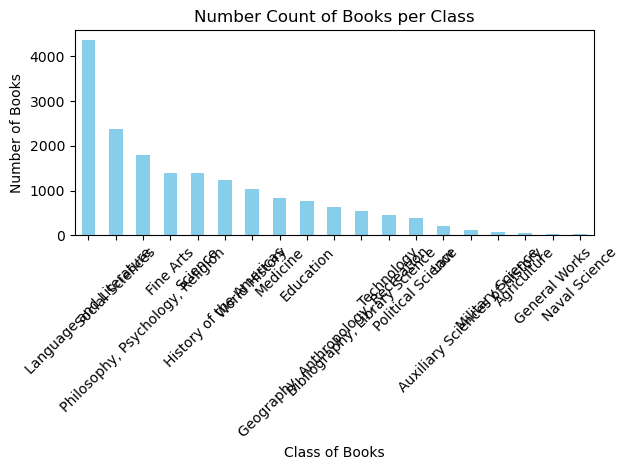

In [293]:
# I'm creating an easy bargraph to see the distribution of books across genres 

class_count = dlibrary["Class_of_Books"].value_counts()
class_count.plot(kind="bar", color="skyblue")
plt.title("Number Count of Books per Class")
plt.xlabel("Class of Books")
plt.ylabel("Number of Books")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

##### As we can see, the default graph is very cluttered and unreadable. So, I am adjusting some of the features like the size of the figure, as well as the order of bars and the positioning. For now, I'm using PlotlyExpress for all of my graphs, later on i might change the library if it will be needed for creating a dashboard.

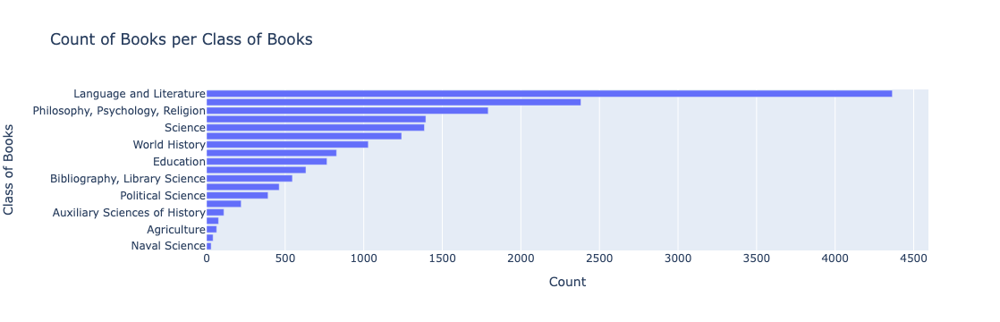

In [294]:
# Count of books per class
import plotly.express as px

class_counts = dlibrary.groupby('Class_of_Books').size().reset_index(name='Count')
class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)

fig1 = px.bar(class_counts_sorted, 
             x='Count', 
             y='Class_of_Books', 
             orientation='h', 
             title='Count of Books per Class of Books',
             labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'})
fig1.show()


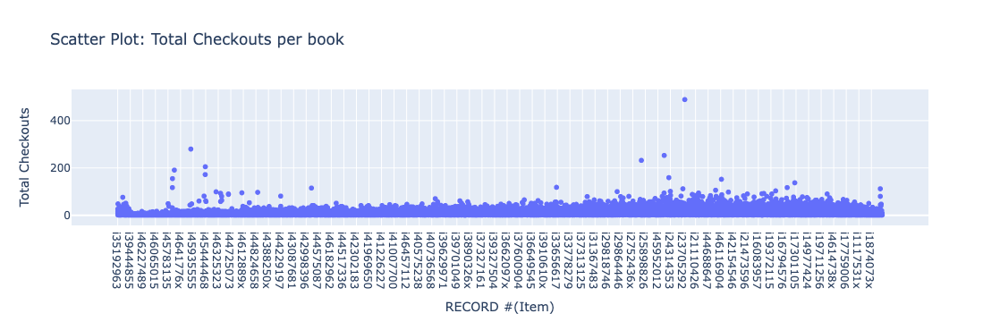

In [295]:
# Scatter plot of total check outs by a book
fig2 = px.scatter(dlibrary, x="RECORD #(Item)", y="Total Checkouts", title="Scatter Plot: Total Checkouts per book")
fig2.show()

As we can see the graph is too clutterd so we need to take another approach

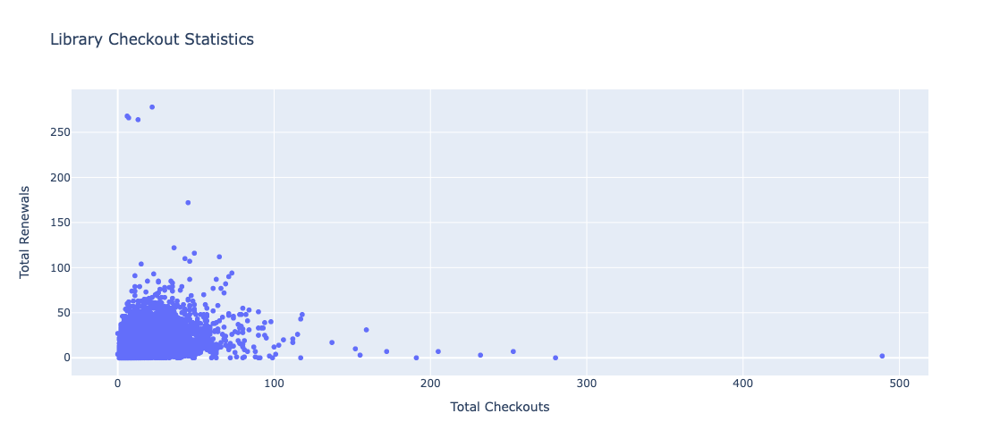

In [296]:
# Libraru Checkout and Renewals Statictics by a book
fig3 = px.scatter(dlibrary,\
       x = 'Total Checkouts', y = "Total Renewals",
height = 500,\
title = "Library Checkout Statistics",
hover_name = 'TITLE',
hover_data = ['Class_of_Books'])
fig3.show()

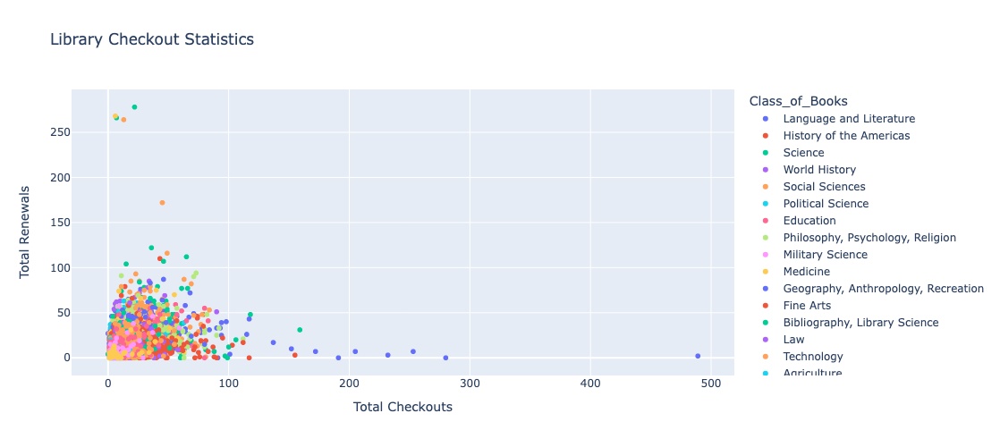

In [297]:
# Adhusting the figure by grouping it in genres 
fig3 = px.scatter(dlibrary,
                  x='Total Checkouts',
                  y='Total Renewals',
                  height=500,
                  title='Library Checkout Statistics',
                  hover_name='TITLE',
                  hover_data=['Class_of_Books'],
                  color='Class_of_Books')  

fig3.show()


As we can see the scatter plot is very confusing so I'm sqitching to the barplot

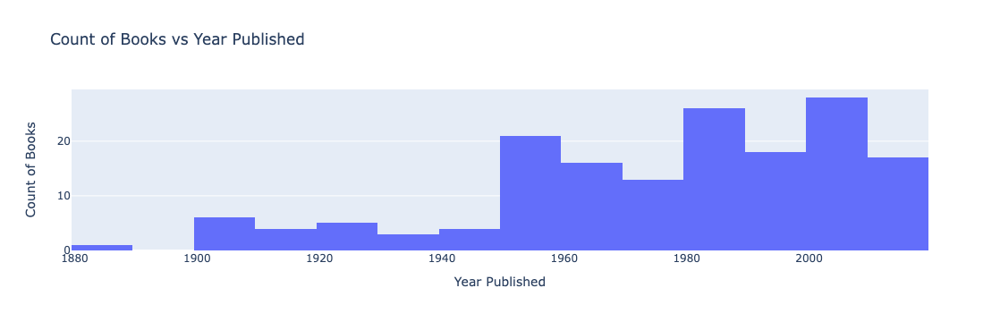

In [298]:
fig5 = px.histogram(dlibrary, 
                   x='Year Published', 
                   nbins=20, 
                   title='Count of Books vs Year Published',
                   labels={'Year Published': 'Year Published', 'count': 'Count of Books'})
fig5.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')
fig5.show()

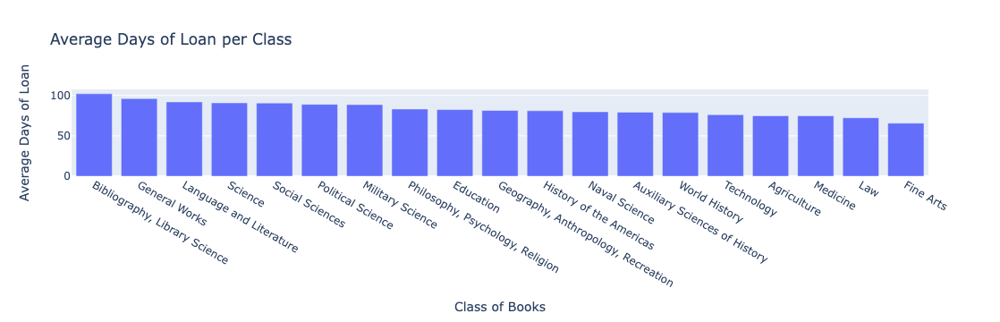

In [299]:
# Visualising the average days per loan statistics
avg_days_loan = dlibrary.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()

fig6 = px.bar(avg_days_loan, 
             x='Class_of_Books', 
             y='Days on Loan', 
             title='Average Days of Loan per Class',
             labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'})
fig6.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')
fig6.show()

Checking the calculated average table to ensure the accuracy of the graph

In [300]:
avg_days_loan

,Class_of_Books,Days on Loan
0,"Bibliography, Library Science",102.142857
1,General Works,96.146341
2,Language and Literature,92.065765
3,Science,90.866522
4,Social Sciences,90.674223
5,Political Science,89.079284
6,Military Science,88.750000
7,"Philosophy, Psychology, Religion",83.251674
8,Education,82.486945
9,"Geography, Anthropology, Recreation",81.571203


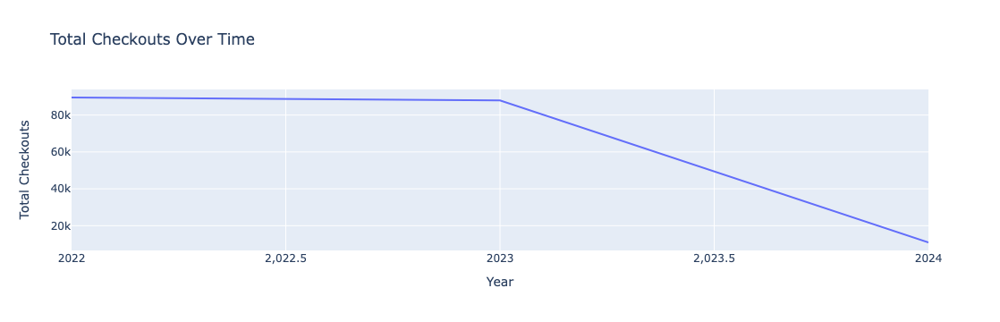

In [301]:
# Checking the trend of total checkouts over time
dlibrary['Last Checkout (date borrowed)'] = pd.to_datetime(dlibrary['Last Checkout (date borrowed)'])
dlibrary['Year'] = dlibrary['Last Checkout (date borrowed)'].dt.year
total_checkouts_over_time = dlibrary.groupby('Year')['Total Checkouts'].sum().reset_index()

fig7 = px.line(total_checkouts_over_time, 
              x='Year', 
              y='Total Checkouts', 
              title='Total Checkouts Over Time',
              labels={'Year': 'Year', 'Total Checkouts': 'Total Checkouts'})
fig7.update_layout(xaxis_title='Year', yaxis_title='Total Checkouts')
fig7.show()

This graph shows the trends of checkout books over time, I wanted to expand the timeline from 2020 to 2024

#### I got this error and asked Chatgpt to troubleshoot it for me, here's the response i got: 
* It seems there was an error because the total_checkouts_over_time DataFrame was not properly appended with the missing years. Instead of appending to the DataFrame directly, you can create a new DataFrame with the missing years and concatenate it with the original DataFrame.
* I changed the code a little bit but I noticed that my dataset lacks entries for checkouts prior to 2022. The Kent State Library only retains the latest checkout and check-in dates for deadline management, which limits my historical data analysis

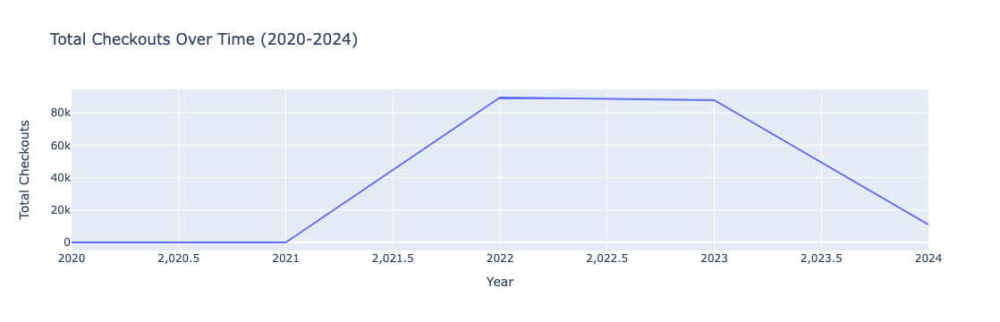

In [302]:
# Here is the modified code chunk for the Total Checkouts Over Time as provided by ChatGPT, however it will not be included in my /
#final dashboard as the data is represented incorrectly 

# Convert 'Last Checkout (date borrowed)' to datetime
dlibrary['Last Checkout (date borrowed)'] = pd.to_datetime(dlibrary['Last Checkout (date borrowed)'])

# Extract year from 'Last Checkout (date borrowed)'
dlibrary['Year'] = dlibrary['Last Checkout (date borrowed)'].dt.year

# Group by year and sum the total checkouts
total_checkouts_over_time = dlibrary.groupby('Year')['Total Checkouts'].sum().reset_index()

# Ensure that the DataFrame includes data for all years from 2020 to 2024
missing_years = pd.DataFrame({'Year': range(2020, 2025), 'Total Checkouts': 0})
total_checkouts_over_time = pd.concat([total_checkouts_over_time, missing_years[~missing_years['Year'].isin(total_checkouts_over_time['Year'])]])

# Sort the DataFrame by year
total_checkouts_over_time = total_checkouts_over_time.sort_values(by='Year')

# Create the line plot
fig = px.line(total_checkouts_over_time, 
              x='Year', 
              y='Total Checkouts', 
              title='Total Checkouts Over Time (2020-2024)',
              labels={'Year': 'Year', 'Total Checkouts': 'Total Checkouts'})
fig.update_layout(xaxis_title='Year', yaxis_title='Total Checkouts')
fig.show()


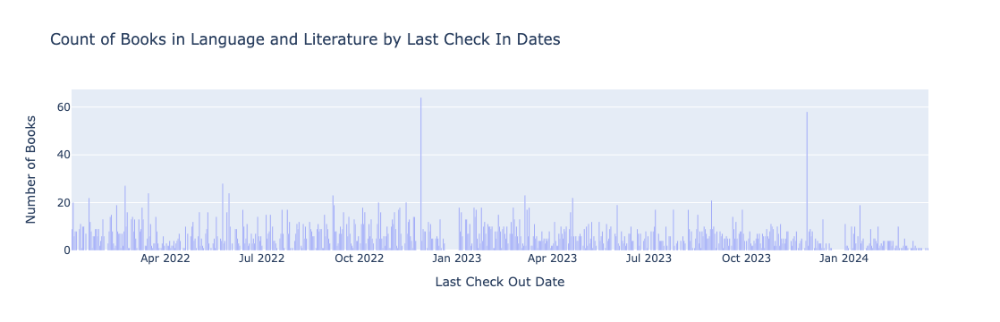

In [303]:
#  trying to visualize the Language and Literature Class by the Check in and Checkout dates

language_literature = dlibrary[dlibrary['Class_of_Books'] == 'Language and Literature']

checkin_counts = language_literature.groupby('Last Checkout (date borrowed)').size().reset_index(name='Count')

# Plot the bar chart
fig8 = px.bar(checkin_counts, 
              x='Last Checkout (date borrowed)', 
              y='Count', 
              title='Count of Books in Language and Literature by Last Check In Dates',
              labels={'Last Checkout (date borrowed)': 'Last Check Out Date', 
                      'Count': 'Number of Books'})
fig8.show()

Since the Class of Language and Literature is very popular in the library, I wanted to visualize the trends of checkins overtime.

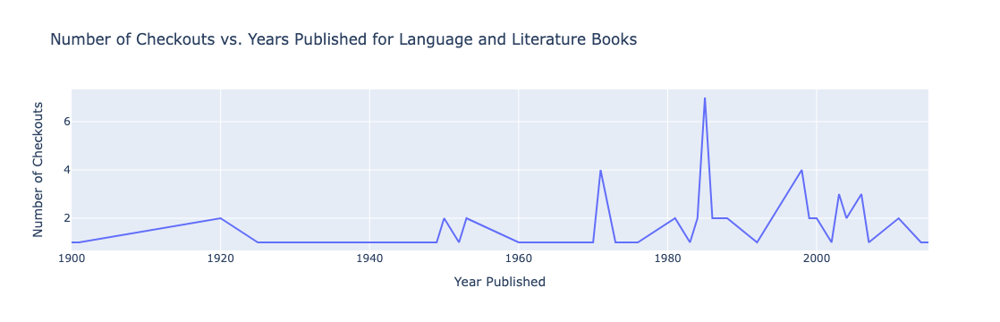

In [304]:
# number of checkout books versus years published in Language and Literature Class

checkout_counts = language_literature.groupby('Year Published').size().reset_index(name='Number of Checkouts')

fig9 = px.line(checkout_counts, 
               x='Year Published', 
               y='Number of Checkouts', 
               title='Number of Checkouts vs. Years Published for Language and Literature Books',
               labels={'Year Published': 'Year Published', 
                       'Number of Checkouts': 'Number of Checkouts'})
fig9.show()


Given the current limited dataset for trends in time research, I'm playing around with the data to see which representation is most successful. The preliminary work is seen above, but changes will be made as I develop my approach to this project.

While this initial exploration provided some insights, there is still much to be done in terms of analysis and visualization.For my next milestone, I intend to add interactive visualizations and a dashboard with filters and sliders. This will provide an expanded overview of the dataset, allowing users to investigate trends and patterns across different types of books. Some of the first visualizations, such as the count of books per class and the number of checkouts versus years of publication, will be improved and incorporated in the final product.

# Milestone 3

## I found this external chunk of code from a website and run it in my notebooj to understand the structure of the code

In [305]:
from dash import Dash, html, dcc, Input, Output, callback
import pandas as pd
import plotly.express as px

external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']

app = Dash(__name__, external_stylesheets=external_stylesheets)

df = pd.read_csv('https://plotly.github.io/datasets/country_indicators.csv')


app.layout = html.Div([
    html.Div([

        html.Div([
            dcc.Dropdown(
                df['Indicator Name'].unique(),
                'Fertility rate, total (births per woman)',
                id='crossfilter-xaxis-column',
            ),
            dcc.RadioItems(
                ['Linear', 'Log'],
                'Linear',
                id='crossfilter-xaxis-type',
                labelStyle={'display': 'inline-block', 'marginTop': '5px'}
            )
        ],
        style={'width': '49%', 'display': 'inline-block'}),

        html.Div([
            dcc.Dropdown(
                df['Indicator Name'].unique(),
                'Life expectancy at birth, total (years)',
                id='crossfilter-yaxis-column'
            ),
            dcc.RadioItems(
                ['Linear', 'Log'],
                'Linear',
                id='crossfilter-yaxis-type',
                labelStyle={'display': 'inline-block', 'marginTop': '5px'}
            )
        ], style={'width': '49%', 'float': 'right', 'display': 'inline-block'})
    ], style={
        'padding': '10px 5px'
    }),

    html.Div([
        dcc.Graph(
            id='crossfilter-indicator-scatter',
            hoverData={'points': [{'customdata': 'Japan'}]}
        )
    ], style={'width': '49%', 'display': 'inline-block', 'padding': '0 20'}),
    html.Div([
        dcc.Graph(id='x-time-series'),
        dcc.Graph(id='y-time-series'),
    ], style={'display': 'inline-block', 'width': '49%'}),

    html.Div(dcc.Slider(
        df['Year'].min(),
        df['Year'].max(),
        step=None,
        id='crossfilter-year--slider',
        value=df['Year'].max(),
        marks={str(year): str(year) for year in df['Year'].unique()}
    ), style={'width': '49%', 'padding': '0px 20px 20px 20px'})
])


@callback(
    Output('crossfilter-indicator-scatter', 'figure'),
    Input('crossfilter-xaxis-column', 'value'),
    Input('crossfilter-yaxis-column', 'value'),
    Input('crossfilter-xaxis-type', 'value'),
    Input('crossfilter-yaxis-type', 'value'),
    Input('crossfilter-year--slider', 'value'))
def update_graph(xaxis_column_name, yaxis_column_name,
                 xaxis_type, yaxis_type,
                 year_value):
    dff = df[df['Year'] == year_value]

    fig = px.scatter(x=dff[dff['Indicator Name'] == xaxis_column_name]['Value'],
            y=dff[dff['Indicator Name'] == yaxis_column_name]['Value'],
            hover_name=dff[dff['Indicator Name'] == yaxis_column_name]['Country Name']
            )

    fig.update_traces(customdata=dff[dff['Indicator Name'] == yaxis_column_name]['Country Name'])

    fig.update_xaxes(title=xaxis_column_name, type='linear' if xaxis_type == 'Linear' else 'log')

    fig.update_yaxes(title=yaxis_column_name, type='linear' if yaxis_type == 'Linear' else 'log')

    fig.update_layout(margin={'l': 40, 'b': 40, 't': 10, 'r': 0}, hovermode='closest')

    return fig


def create_time_series(dff, axis_type, title):

    fig = px.scatter(dff, x='Year', y='Value')

    fig.update_traces(mode='lines+markers')

    fig.update_xaxes(showgrid=False)

    fig.update_yaxes(type='linear' if axis_type == 'Linear' else 'log')

    fig.add_annotation(x=0, y=0.85, xanchor='left', yanchor='bottom',
                       xref='paper', yref='paper', showarrow=False, align='left',
                       text=title)

    fig.update_layout(height=225, margin={'l': 20, 'b': 30, 'r': 10, 't': 10})

    return fig


@callback(
    Output('x-time-series', 'figure'),
    Input('crossfilter-indicator-scatter', 'hoverData'),
    Input('crossfilter-xaxis-column', 'value'),
    Input('crossfilter-xaxis-type', 'value'))
def update_x_timeseries(hoverData, xaxis_column_name, axis_type):
    country_name = hoverData['points'][0]['customdata']
    dff = df[df['Country Name'] == country_name]
    dff = dff[dff['Indicator Name'] == xaxis_column_name]
    title = '<b>{}</b><br>{}'.format(country_name, xaxis_column_name)
    return create_time_series(dff, axis_type, title)


@callback(
    Output('y-time-series', 'figure'),
    Input('crossfilter-indicator-scatter', 'hoverData'),
    Input('crossfilter-yaxis-column', 'value'),
    Input('crossfilter-yaxis-type', 'value'))
def update_y_timeseries(hoverData, yaxis_column_name, axis_type):
    dff = df[df['Country Name'] == hoverData['points'][0]['customdata']]
    dff = dff[dff['Indicator Name'] == yaxis_column_name]
    return create_time_series(dff, axis_type, yaxis_column_name)


if __name__ == '__main__':
    app.run(debug=True)

## Now I am building my own dashboard utilizing graphs I have created before

In [306]:
import pandas as pd
import plotly.express as px
import dash
from dash import html, dcc, Input, Output



app = dash.Dash(__name__)

class_counts = dlibrary.groupby('Class_of_Books').size().reset_index(name='Count')
class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)

# Creating figures
fig1 = px.bar(class_counts_sorted, 
              x='Count', 
              y='Class_of_Books', 
              orientation='h', 
              title='Count of Books per Class of Books',
              labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'})

fig5 = px.histogram(dlibrary, 
                    x='Year Published', 
                    nbins=20, 
                    title='Count of Books vs Year Published',
                    labels={'Year Published': 'Year Published', 'count': 'Count of Books'})

avg_days_loan = dlibrary.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
fig6 = px.bar(avg_days_loan, 
              x='Class_of_Books', 
              y='Days on Loan', 
              title='Average Days of Loan per Class',
              labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'})

# Defining a layout
app.layout = html.Div([
    html.H1("Library Statistics Dashboard"),
    
    # Adding filter components
    html.Div([
        html.Label("Filter by Year Published:"),
        dcc.RangeSlider(
            id='year-slider',
            min=dlibrary['Year Published'].min(),
            max=dlibrary['Year Published'].max(),
            value=[dlibrary['Year Published'].min(), dlibrary['Year Published'].max()],
            marks={str(year): str(year) for year in range(int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())+1, 5)},
            step=1
        ),
        
        html.Label("Filter by Class of Books:"),
        dcc.Dropdown(
            id='class-dropdown',
            options=[{'label': cls, 'value': cls} for cls in dlibrary['Class_of_Books'].unique()],
            multi=True,
            value=list(dlibrary['Class_of_Books'].unique())
        )
    ]),
    
    # Plotting
    html.Div([
        dcc.Graph(id='count-per-class', figure=fig1),
        dcc.Graph(id='books-vs-year', figure=fig5),
        dcc.Graph(id='avg-days-loan', figure=fig6)
    ])
])

# Adding callbacks to update plots based on filters
@app.callback(
    [Output('count-per-class', 'figure'),
     Output('books-vs-year', 'figure'),
     Output('avg-days-loan', 'figure')],
    [Input('year-slider', 'value'),
     Input('class-dropdown', 'value')]
)
def update_plots(year_range, selected_classes):
    filtered_data = dlibrary[(dlibrary['Year Published'] >= year_range[0]) & 
                             (dlibrary['Year Published'] <= year_range[1]) & 
                             (dlibrary['Class_of_Books'].isin(selected_classes))]
    
    class_counts = filtered_data.groupby('Class_of_Books').size().reset_index(name='Count')
    class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)
    fig1 = px.bar(class_counts_sorted, 
                  x='Count', 
                  y='Class_of_Books', 
                  orientation='h', 
                  title='Count of Books per Class of Books',
                  labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'})
    
    fig5 = px.histogram(filtered_data, 
                        x='Year Published', 
                        nbins=20, 
                        title='Count of Books vs Year Published',
                        labels={'Year Published': 'Year Published', 'count': 'Count of Books'})
    
    avg_days_loan = filtered_data.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
    fig6 = px.bar(avg_days_loan, 
                  x='Class_of_Books', 
                  y='Days on Loan', 
                  title='Average Days of Loan per Class',
                  labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'})
    
    return fig1, fig5, fig6


if __name__ == '__main__':
    app.run_server(debug=True)


In [307]:
from dash import Dash, html, dcc, Input, Output, callback
import pandas as pd
import plotly.express as px



class_counts = dlibrary.groupby('Class_of_Books').size().reset_index(name='Count')
class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)

fig1 = px.bar(class_counts_sorted, 
              x='Count', 
              y='Class_of_Books', 
              orientation='h', 
              title='Count of Books per Class of Books',
              labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'})

fig5 = px.histogram(dlibrary, 
                    x='Year Published', 
                    nbins=20, 
                    title='Count of Books vs Year Published',
                    labels={'Year Published': 'Year Published', 'count': 'Count of Books'})
fig5.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')

avg_days_loan = dlibrary.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
fig6 = px.bar(avg_days_loan, 
              x='Class_of_Books', 
              y='Days on Loan', 
              title='Average Days of Loan per Class',
              labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'})
fig6.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')


external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']
app = Dash(__name__, external_stylesheets=external_stylesheets)

# Defining a  layout 
app.layout = html.Div([
    html.H1("Library Statistics Dashboard"),
    
    # Filtering components
    html.Div([
        html.Label("Filter by Year Published:"),
        dcc.RangeSlider(
            id='year-slider',
            min=int(dlibrary['Year Published'].min()),
            max=int(dlibrary['Year Published'].max()),
            marks={str(year): str(year) for year in range(int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())+1, 5)},
            value=[int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())],
            step=1
        ),
    ]),
    
    # choosing content layout with graphs e
    html.Div([
        # Left column for the first graph 
        html.Div([
            dcc.Graph(id='count-per-class', figure=fig1)
        ], style={'width': '70%', 'display': 'inline-block'}),
        
        # Right column for the other two graphs
        html.Div([
            dcc.Graph(id='books-vs-year', figure=fig5),
            dcc.Graph(id='avg-days-loan', figure=fig6)
        ], style={'width': '30%', 'display': 'inline-block', 'float': 'right'})
    ])
])

# Defining callbacks to update graphs based on year slider
@callback(
    Output('books-vs-year', 'figure'),
    Output('avg-days-loan', 'figure'),
    Input('year-slider', 'value')
)
def update_graphs(year_range):
    filtered_data = dlibrary[(dlibrary['Year Published'] >= year_range[0]) & (dlibrary['Year Published'] <= year_range[1])]
    
    # updating graphs
    fig_books_vs_year = px.histogram(filtered_data, 
                                     x='Year Published', 
                                     nbins=20, 
                                     title='Count of Books vs Year Published',
                                     labels={'Year Published': 'Year Published', 'count': 'Count of Books'})
    fig_books_vs_year.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')
    

    avg_days_loan_filtered = filtered_data.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
    fig_avg_days_loan = px.bar(avg_days_loan_filtered, 
                                x='Class_of_Books', 
                                y='Days on Loan', 
                                title='Average Days of Loan per Class',
                                labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'})
    fig_avg_days_loan.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')
    
    return fig_books_vs_year, fig_avg_days_loan


if __name__ == '__main__':
    app.run_server(debug=True)


## I tried to do the filtering by Year Published and Class of Books, however the Class of Book filter gives me an error since it is a categorical value. After some researching i decided to get rid of the Class of books dropdown filter, since all of the graphs in the dashboard showcase the diferent genres. 

Here i am changing the colors of the dashboard to Kent state colors

In [308]:
from dash import Dash, html, dcc, Input, Output, callback
import pandas as pd
import plotly.express as px

# Creating initial figures
class_counts = dlibrary.groupby('Class_of_Books').size().reset_index(name='Count')
class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)

fig1 = px.bar(class_counts_sorted, 
              x='Count', 
              y='Class_of_Books', 
              orientation='h', 
              title='Count of Books per Class of Books',
              labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'},
              template='plotly_dark')

fig5 = px.histogram(dlibrary, 
                    x='Year Published', 
                    nbins=20, 
                    title='Count of Books vs Year Published',
                    labels={'Year Published': 'Year Published', 'count': 'Count of Books'},
                    template='plotly_dark')
fig5.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')

avg_days_loan = dlibrary.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
fig6 = px.bar(avg_days_loan, 
              x='Class_of_Books', 
              y='Days on Loan', 
              title='Average Days of Loan per Class',
              labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'},
              template='plotly_dark')
fig6.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')


external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']
app = Dash(__name__, external_stylesheets=external_stylesheets)

# Defining the layout of the Dash app
app.layout = html.Div([
    html.H1("Library Statistics Dashboard", style={'color': '#ffcc00'}),
    
    # Filtering components
    html.Div([
        html.Label("Filter by Year Published:", style={'color': '#ffcc00'}),
        dcc.RangeSlider(
            id='year-slider',
            min=int(dlibrary['Year Published'].min()),
            max=int(dlibrary['Year Published'].max()),
            marks={str(year): str(year) for year in range(int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())+1, 5)},
            value=[int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())],
            step=1
        ),
    ]),
    
    # Choosing content layout with graphs side by side
    html.Div([
        # Left column for the first graph 
        html.Div([
            dcc.Graph(id='count-per-class', figure=fig1)
        ], style={'width': '70%', 'display': 'inline-block'}),
        
        # Right column for the other two graphs
        html.Div([
            dcc.Graph(id='books-vs-year', figure=fig5),
            dcc.Graph(id='avg-days-loan', figure=fig6)
        ], style={'width': '30%', 'display': 'inline-block', 'float': 'right'})
    ], style={'background-color': '#00194C', 'padding': '20px'}),
    
    # Adding Kent State logo image
    html.Img(src='/Users/sofiyaibraeva/Downloads/logo.png', style={'width': '150px', 'position': 'absolute', 'top': '10px', 'right': '10px'})
], style={'color': '#ffcc00', 'font-family': 'Arial', 'background-color': '#00194C'})

# Defining callback to update graphs based on year slider
@callback(
    Output('books-vs-year', 'figure'),
    Output('avg-days-loan', 'figure'),
    Input('year-slider', 'value')
)
def update_graphs(year_range):
    filtered_data = dlibrary[(dlibrary['Year Published'] >= year_range[0]) & (dlibrary['Year Published'] <= year_range[1])]
    
    # Updating books vs. year histogram
    fig_books_vs_year = px.histogram(filtered_data, 
                                     x='Year Published', 
                                     nbins=20, 
                                     title='Count of Books vs Year Published',
                                     labels={'Year Published': 'Year Published', 'count': 'Count of Books'},
                                     template='plotly_dark')
    fig_books_vs_year.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')
    
    # Updating average days of loan per class chart
    avg_days_loan_filtered = filtered_data.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
    fig_avg_days_loan = px.bar(avg_days_loan_filtered, 
                                x='Class_of_Books', 
                                y='Days on Loan', 
                                title='Average Days of Loan per Class',
                                labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'},
                                template='plotly_dark')
    fig_avg_days_loan.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')
    
    return fig_books_vs_year, fig_avg_days_loan


if __name__ == '__main__':
    app.run_server(debug=True)


In [309]:
from dash import Dash, html, dcc, Input, Output
import pandas as pd
import plotly.express as px

# Creating initial figures
class_counts = dlibrary.groupby('Class_of_Books').size().reset_index(name='Count')
class_counts_sorted = class_counts.sort_values(by='Count', ascending=True)
fig1 = px.bar(class_counts_sorted, 
              x='Count', 
              y='Class_of_Books', 
              orientation='h', 
              title='Count of Books per Class of Books',
              labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'},
              template='plotly_dark')

fig5 = px.histogram(dlibrary, 
                    x='Year Published', 
                    nbins=20, 
                    title='Count of Books vs Year Published',
                    labels={'Year Published': 'Year Published', 'count': 'Count of Books'},
                    template='plotly_dark')
fig5.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')

avg_days_loan = dlibrary.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
fig6 = px.bar(avg_days_loan, 
              x='Class_of_Books', 
              y='Days on Loan', 
              title='Average Days of Loan per Class',
              labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'},
              template='plotly_dark')
fig6.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')


external_stylesheets = ['https://codepen.io/chriddyp/pen/bWLwgP.css']
app = Dash(__name__, external_stylesheets=external_stylesheets)

# Defining the layout of the Dash app
app.layout = html.Div([
    html.H1("Library Statistics Dashboard", style={'color': '#ffcc00'}),
    
    # Filtering components
    html.Div([
        html.Label("Filter by Year Published:", style={'color': '#ffcc00'}),
        dcc.RangeSlider(
            id='year-slider',
            min=int(dlibrary['Year Published'].min()),
            max=int(dlibrary['Year Published'].max()),
            marks={str(year): str(year) for year in range(int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())+1, 5)},
            value=[int(dlibrary['Year Published'].min()), int(dlibrary['Year Published'].max())],
            step=1
        ),
    ]),
    
    # First block of the dash: Count of Books per Class (full width)
    html.Div([
        dcc.Graph(id='count-per-class', figure=fig1)
    ], style={'width': '100%'}),
    
    # Second block: Count of Books vs Year Published and Average Days of Loan per Class
    html.Div([
        # Left column: Count of Books vs Year Published
        html.Div([
            dcc.Graph(id='books-vs-year', figure=fig5)
        ], style={'width': '50%', 'display': 'inline-block'}),
        
        # Right column: Average Days of Loan per Class
        html.Div([
            dcc.Graph(id='avg-days-loan', figure=fig6)
        ], style={'width': '50%', 'display': 'inline-block'})
    ], style={'width': '100%', 'display': 'inline-block'})
], style={'color': '#ffcc00', 'font-family': 'Arial', 'background-color': '#00194C'})


# inserting Kent State logo in the top right corner
html.Img(src='/Users/sofiyaibraeva/Downloads/logo.png', style={'width': '150px', 'position': 'absolute', 'top': '10px', 'right': '10px'})


# Defining callback to update all graphs based on year slider
@app.callback(
    Output('count-per-class', 'figure'),
    Output('books-vs-year', 'figure'),
    Output('avg-days-loan', 'figure'),
    Input('year-slider', 'value')
)
def update_graphs(year_range):
    filtered_data = dlibrary[(dlibrary['Year Published'] >= year_range[0]) & (dlibrary['Year Published'] <= year_range[1])]
    
    # Updating Count of Books per Class
    class_counts_filtered = filtered_data.groupby('Class_of_Books').size().reset_index(name='Count')
    class_counts_sorted_filtered = class_counts_filtered.sort_values(by='Count', ascending=True)
    fig_count_per_class = px.bar(class_counts_sorted_filtered, 
                                 x='Count', 
                                 y='Class_of_Books', 
                                 orientation='h', 
                                 title='Count of Books per Class of Books',
                                 labels={'Count': 'Count', 'Class_of_Books': 'Class of Books'},
                                 template='plotly_dark')
    
    # Updating Count of Books vs Year Published histogram
    fig_books_vs_year = px.histogram(filtered_data, 
                                     x='Year Published', 
                                     nbins=20, 
                                     title='Count of Books vs Year Published',
                                     labels={'Year Published': 'Year Published', 'count': 'Count of Books'},
                                     template='plotly_dark')
    fig_books_vs_year.update_layout(xaxis_title='Year Published', yaxis_title='Count of Books')
    
    # Updating Average Days of Loan per Class bar chart
    avg_days_loan_filtered = filtered_data.groupby('Class_of_Books')['Days on Loan'].mean().sort_values(ascending=False).reset_index()
    fig_avg_days_loan = px.bar(avg_days_loan_filtered, 
                                x='Class_of_Books', 
                                y='Days on Loan', 
                                title='Average Days of Loan per Class',
                                labels={'Class_of_Books': 'Class of Books', 'Days on Loan': 'Average Days of Loan'},
                                template='plotly_dark')
    fig_avg_days_loan.update_layout(xaxis_title='Class of Books', yaxis_title='Average Days of Loan')
 
# inserting Kent State logo in the top right corner
    html.Img(src='/Users/sofiyaibraeva/Downloads/logo.png', style={'width': '150px', 'position': 'absolute', 'top': '10px', 'right': '10px'})
  
    return fig_count_per_class, fig_books_vs_year, fig_avg_days_loan

# Runing the Dash app
if __name__ == '__main__':
    app.run_server(debug=True)



* I have created a first page og my dashboard that represents an overview of the dataset. Before the final submission I want to explore a could of other things:
* I want to add the Kent State Loho on the top right corner of my overview page;
* I want to color coordinate some numbers in the graph to create a story;
* I am thinking about creating a second page to explore the Language and Literature Class of Books in more details.